<h1 align=center><font size = 10>Analysis of neighbourhoods in Barcelona to open an ecological supermarket II</font></h1>

<h3 align=center>Autor: Guillermo Fantoni</h3> 

![Barcelona](Eixample_aire.png)

<br></br>

Once the data referring to the neighborhoods of Barcelona have been obtained, these data are analyzed to identify a relationship between the neighborhoods and their businesses. The neighborhood data is obtained by webscrapting on wikipedia, and their locations with the geopy API. Socio-economic data is obtained from official statistical sources and business data from the Foursquare API.

The data collecting and processing have been viewed in the <a href = "https://github.com/gfantonipy/Data-science-recursos/blob/main/IBM%20Certificate/10.-capstone/1%20Notebook-DATA/CAPSTONE(3.0).ipynb "> first notebook </a>


## Table of Contents

* [1.-Abstract](#Abstract)

* [2.-Introduction ](#intro)

* [3.-Methodology](#meto)

* [4.- Import and process Data](#data)

* [5.- Analysis](#Analisis)

   * [5.1.- Analisis de los negocios predominantes en cada barrio. Kmeans](#2.1)

   * [5.2.- Clustering by socieconomic indicators with K-Means](#2.2)

   *  [5.3.- Best neighborhoods applying weighted factors](#2.3)

   *  [5.4.- Multiple linear regreserion](#2.4)

* [6.- Results](#resultados)

* [7.- Discussion ](#discus)

* [8.- Conclusions](#conclusiones)

* [9.-References](#ref)

# 1.-Abstract <a name = "meto"></a>
This study is part of the final project of the IBM data science course. The only purposes of this study is to demonstrate the skills acquired during the course.
The main requirement is to use Foursquare to obtain the locations of interest, this is a problem because using the free version does not obtain all the locations and the results loses precision. It should be taken into account for the data analyzed.

The objective of this study is analyze the Neighbourhoods data to determine **What are the best neighborhoods to open a Ecological supermarket**

# 2.-Introduction <a name = "intro"></a>

Barcelona is the second city in Spain with 1.6 million people. It is one of the cities with the most trade and tourism in Europe. Its situation with a maritime port in the Mediterranean and communication with Europe makes it interesting on several levels. Given its population and level of commerce, it is an ideal place to open new businesses, the question is, what is the best neighbourhood to open a business?      
 
_In this study we put ourselves in the shoes of a consultant who is asked for a study in which to select a list of neighbourhoods to set up an ecological supermarket._     

The study can be carried out for any type of business and the socioeconomic parameters of interest. It is not an accurate study but it does provide an idea of which sites are ideal to start a more in-depth study. Anyone interested in starting a business can benefit from this study, and even use the notebook in a simple way to obtain personalized results.

Obviously each business has its characteristics and you have to take them into account to choose the most suitable neighbourhood.The study focuses on generic businesses and therefore neighbourhoods with little competition are sought


# 3.- Methodology <a name = "meto"></a>

The data collects various points of interest such as population, age ranges, economic indicators, and businesses. In the first place, the neighborhoods can be grouped by clusters and see which neighbourhoods have similar qualities to those that have green businesses but have not yet opened this type of business. The factors can be used to see which neighborhood interests us the most, a high population with high incomes, a young population and the absence of similar businesses, giving more weight to a value or others, we can have which neighborhoods have a higher score depending on the parameters that we interest.    

The data is extracted through various techniques, such as Webscrapting, REST APIs calling such as foursquare and geopy and official statistical reports from the Barcelona official website.      

For webscrapting and Foursaquare the data is cleaned in the extraction process. For the data obtained from official sites, they are processed with excel to match the key fields and present the appropriate format. With geopy, a visual inspection of the locations is carried out using Folium and representing the coordinates obtained on the map, with the support of a colormap and a GEOJSON file, the task is carried out more easily.


The data are analyzed with multiple linear regression techniques to determine how the factors studied affect the number of organic supermarkets. Although in the data obtained from foursquare there are categories in addition to supermarkets, for example vegan restaurants, we are interested in seeing the trend of organic businesses, to have more data to analyze with these trends.

The data are also grouped in clusters by their types of businesses and by socioeconomic factors applying the K Means method.

An analysis is also applied giving weight to each factor to analyze the neighborhoods if the information is obtained from other studies. For example, a study is carried out where it is determined that young people between 20-30 years old have a penchant for organic food. We can give each factor a weight with the data obtained from other studies and analyze which are the best neighborhoods to set up an ecological business.


# 4.- Import and process Data <a name="data"></a>

In first place, we import the data obtained from the first notebook and process for the machine learning techniques 

In [1]:
#ALL modules imported 
#!pip install bs4
#from bs4 import BeautifulSoup # this module helps in web scrapping.
import requests  # this module helps us to download a web page
import pandas as pd  #pandas allows us to easily work with dataframes
import matplotlib.pyplot as plt 
import numpy as np 
#!conda install -c conda-forge geopy --yes  
#from geopy.geocoders import Nominatim   # to obtian the coordinates with the neighbourhood names. 
import folium     # Folium to interactive maps. 
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import json # library to handle JSON files
#!conda install -c conda-forge wordcloud==1.4.1 --yes
#from wordcloud import WordCloud, STOPWORDS  # create wordclouds
import plotly.express as px

### Import all the data obtained in the <a href = "https://github.com/gfantonipy/Coursera_Capstone/tree/main/CAPSTONE/notebooks "> first notebook </a>. All the data are keep in the  <a href = "https://github.com/gfantonipy/Coursera_Capstone/tree/main/CAPSTONE/dataset">Github Repository </a>

In [2]:
bcn_data = pd.read_csv("bcn_data.csv")
bcn_population = pd.read_excel("Neighbourhood_population.xlsx")
neig_unem_perc = pd.read_excel("Neighbourhood_unemployment_percentage_2020_2021.xlsx")
bcn_age_groups = pd.read_csv("bcn_age_groups.csv")
RFD = pd.read_excel("RFD_Neighbourhood.xlsx")
bcn_b_eco = pd.read_csv("bcn_bussines_eco.csv")
bcn_b_org = pd.read_csv("bcn_bussines_org.csv")
bcn_b_mar = pd.read_csv("bcn_bussines_Ecologic Market.csv")
bcn_b = pd.read_csv("bcn_bussines.csv")

Obtain the number of target venues for each neighbourhood

In [3]:
bcn_eco_bussines = pd.concat([bcn_b_org, bcn_b_eco,bcn_b_mar])
bcn_eco = pd.DataFrame(columns = ['Venue count'])
bcn_eco["Venue count"] = bcn_eco_bussines.groupby('Neighbourhood').count()["Venue"]
bcn_eco.head()

,Venue count
Neighbourhood,
Baix Guinardó,1
Barrio Gótico,12
Camp d'en Grassot i Gràcia Nova,3
Can Baró,1
Diagonal Mar i Front Marítim del Poblenou,1


In [4]:
bcn_eco_bussines.to_csv("bcn_eco_bussines.csv", index = False) # export to csv the data of ecologic bussines

#### Join all data in one DataFrame to group the important information
The dataframe contain the data of Neighbourhoods such as coordinates, population, population groups, RFD indicators, and unemployement rate. 

In [5]:
bcn_data_pop = bcn_data.join(bcn_population[["Neighbourhood","Population"]].set_index('Neighbourhood'), on='Neighbourhood', how='inner')
bcn_data_pop_RFD = bcn_data_pop.join(RFD[["Neighbourhood",2017]].set_index('Neighbourhood'), on='Neighbourhood', how='inner')
bcn_data_pop_RFD_age = bcn_data_pop_RFD.join(bcn_age_groups.set_index('Neighbourhood'), on='Neighbourhood', how='inner')
bcn_all = bcn_data_pop_RFD_age.join(neig_unem_perc[["Neighbourhood","Población 16-64 años","2021-3"]].set_index('Neighbourhood'), on='Neighbourhood', how='inner')

In [6]:
bcn_all.head() # Show the data 

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,2017,TOTAL,0-14,15-29,30-44,45-59,60-74,75-89,>=90,Población 16-64 años,2021-3
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368,47353,71.2,47353,5993,10382,14562,9113,4512,2375,416,36330,14.5
1,1,Ciutat Vella,2,Barrio Gótico,41.383395,2.176912,18629,106.1,18629,1425,4742,6147,3382,1829,915,189,17931,7.9
2,1,Ciutat Vella,3,La Barceloneta,41.380653,2.189927,14857,79.6,14857,1146,3140,4503,2774,1788,1310,196,11346,12.9
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",41.388322,2.177411,22590,99.4,22590,2116,4997,7143,4224,2406,1458,246,17817,11.3
4,2,Eixample,5,El Fort Pienc,41.395925,2.182325,32349,106.5,32349,3706,5455,8028,6338,5223,3049,550,22474,7.4


Obtain the columns names, and rename 

In [7]:
bcn_all.columns.values.tolist() # Show the columns for rename correctly

['NºBorough',
 'Borough',
 'NºNeighbourhood',
 'Neighbourhood',
 'latitude',
 'longitude',
 'Population',
 2017,
 'TOTAL',
 '0-14',
 '15-29',
 '30-44',
 '45-59',
 '60-74',
 '75-89',
 '>=90',
 'Población 16-64 años',
 '2021-3']

In [8]:
bcn_all.rename(columns = {2017: 'RFD',   # Rename the columns with clearly names
 '0-14' :'0-14years',
 '15-29':'15-29years',
 '30-44':'30-44years',
 '45-59':'45-59years',
 '60-74':'60-74years',
 '75-89': '75-89years',
 '>=90' :'>=90years',
 'Población 16-64 años':'can work population',
 '2021-3': 'unemployement rate'}, inplace = True)
bcn_all.drop('TOTAL', axis = 1, inplace = True)
bcn_all.head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368,47353,71.2,5993,10382,14562,9113,4512,2375,416,36330,14.5
1,1,Ciutat Vella,2,Barrio Gótico,41.383395,2.176912,18629,106.1,1425,4742,6147,3382,1829,915,189,17931,7.9
2,1,Ciutat Vella,3,La Barceloneta,41.380653,2.189927,14857,79.6,1146,3140,4503,2774,1788,1310,196,11346,12.9
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",41.388322,2.177411,22590,99.4,2116,4997,7143,4224,2406,1458,246,17817,11.3
4,2,Eixample,5,El Fort Pienc,41.395925,2.182325,32349,106.5,3706,5455,8028,6338,5223,3049,550,22474,7.4


Show the data have not nulls and datatype

In [9]:
bcn_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73 entries, 0 to 72
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   NºBorough            73 non-null     int64  
 1   Borough              73 non-null     object 
 2   NºNeighbourhood      73 non-null     int64  
 3   Neighbourhood        73 non-null     object 
 4   latitude             73 non-null     float64
 5   longitude            73 non-null     float64
 6   Population           73 non-null     int64  
 7   RFD                  73 non-null     float64
 8   0-14years            73 non-null     int64  
 9   15-29years           73 non-null     int64  
 10  30-44years           73 non-null     int64  
 11  45-59years           73 non-null     int64  
 12  60-74years           73 non-null     int64  
 13  75-89years           73 non-null     int64  
 14  >=90years            73 non-null     int64  
 15  can work population  73 non-null     int64

In [10]:
bcn_all.to_csv("bcn_all_data.csv", index = False) # export the correct data of all indicators to keep it 

Join the data of neighbourhoods with the number of target venues to analyze the relationships

In [11]:
bcn_all = pd.read_csv("bcn_all_data.csv")
bcn_all_venue = bcn_all.join(bcn_eco, on='Neighbourhood', how='left')
bcn_all_venue["Venue count"].fillna(0, inplace = True)
bcn_all_venue.head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368,47353,71.2,5993,10382,14562,9113,4512,2375,416,36330,14.5,8.0
1,1,Ciutat Vella,2,Barrio Gótico,41.383395,2.176912,18629,106.1,1425,4742,6147,3382,1829,915,189,17931,7.9,12.0
2,1,Ciutat Vella,3,La Barceloneta,41.380653,2.189927,14857,79.6,1146,3140,4503,2774,1788,1310,196,11346,12.9,1.0
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",41.388322,2.177411,22590,99.4,2116,4997,7143,4224,2406,1458,246,17817,11.3,6.0
4,2,Eixample,5,El Fort Pienc,41.395925,2.182325,32349,106.5,3706,5455,8028,6338,5223,3049,550,22474,7.4,1.0


In [12]:
bcn_all_venue.to_csv("bcn_all_data_venue.csv", index = False)  # Export all the necessary data to analyze the neighbourhoods. 

### Normalize the data 

Normalize the data to train the clustering and regression models. 

The data is normalized applying the **simple feature scaling method**. 

$                               Xnew = \frac{Xold}{Xmax}$

In [13]:
bcn_all_index = pd.read_csv("bcn_all_data_venue.csv")
columns = bcn_all_venue.columns.values.tolist()
for a in columns[4:]:
    bcn_all_index[a] = bcn_all_venue[a]/bcn_all_venue[a].max()

bcn_all_index.head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count
0,1,Ciutat Vella,1,El Raval,0.997958,0.979444,0.815981,0.286174,0.778413,1.000000,1.000000,0.721365,0.426505,0.401386,0.396568,0.943882,0.843023,0.666667
1,1,Ciutat Vella,2,Barrio Gótico,0.998051,0.983303,0.321013,0.426447,0.185089,0.456752,0.422126,0.267712,0.172890,0.154639,0.180172,0.465861,0.459302,1.000000
2,1,Ciutat Vella,3,La Barceloneta,0.997985,0.989182,0.256014,0.319936,0.148851,0.302447,0.309230,0.219584,0.169014,0.221396,0.186845,0.294778,0.750000,0.083333
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",0.998170,0.983529,0.389268,0.399518,0.274841,0.481314,0.490523,0.334362,0.227432,0.246409,0.234509,0.462899,0.656977,0.500000
4,2,Eixample,5,El Fort Pienc,0.998353,0.985748,0.557434,0.428055,0.481361,0.525429,0.551298,0.501702,0.493714,0.515295,0.524309,0.583892,0.430233,0.083333


In [14]:
bcn_all_index.to_csv("bcn_all_data_normalized.csv", index = False) # export the normalize data for the clustering and multiple linerar regresion 

# 5.-Analysis <a name = Analisis></a>

The analysis is carried out studying the correlation between the variables, and making clusters. Neighborhoods are grouped by the businesses they have and also by socioeconomic indicators. A multiple linear regression is performed to study the relationship between the data of the selected neighborhoods and the number of businesses that interest us.

#### Linear correlation between the variables 
It begins by carrying out a superficial analysis of the correlation between the variables.

<AxesSubplot:>

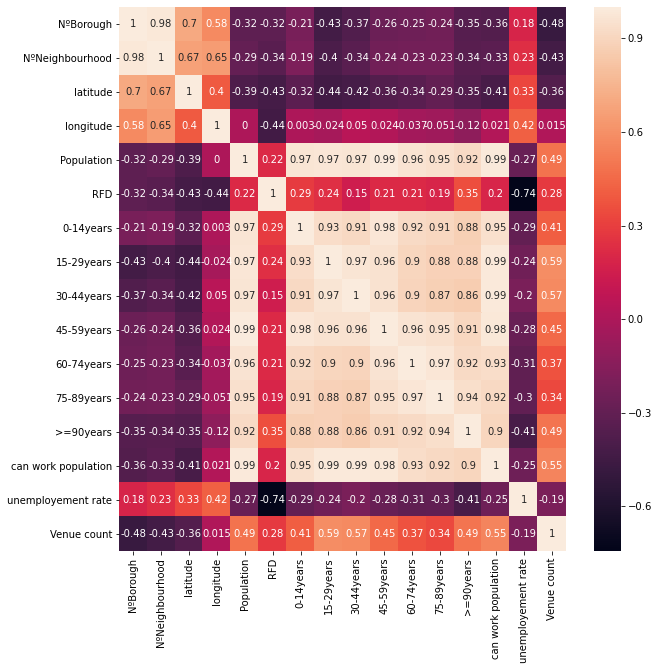

In [15]:
import seaborn as sns

fig, ax = plt.subplots(figsize=(10,10))  

sns.heatmap(bcn_all_venue.corr().round(3), annot=True, ax= ax)

You can see a strong relationship between the population and the age groups, this identifies that there is a similar percentage of the population for each age group. A strong relationship is also seen for the unemployment rate and the RFD economic indicator.

In [16]:
bcn_all_index.corr()["Venue count"].sort_values() 

NºBorough             -0.480703
NºNeighbourhood       -0.433457
latitude              -0.362160
unemployement rate    -0.192368
longitude              0.014804
RFD                    0.281919
75-89years             0.337120
60-74years             0.370754
0-14years              0.411439
45-59years             0.454123
Population             0.489288
>=90years              0.493206
can work population    0.552178
30-44years             0.573154
15-29years             0.586913
Venue count            1.000000
Name: Venue count, dtype: float64

With this correlation can be created a first idea of the weight for each variable. 
The RFD indicator have a relationship, but the unemployement rate have a negative correlation this means the higher the unemployment, the fewer the businesses, this is totally logical.
For other way the age groups that have higher relationship are the age group of 15 to 29 years old. The younger group that can work

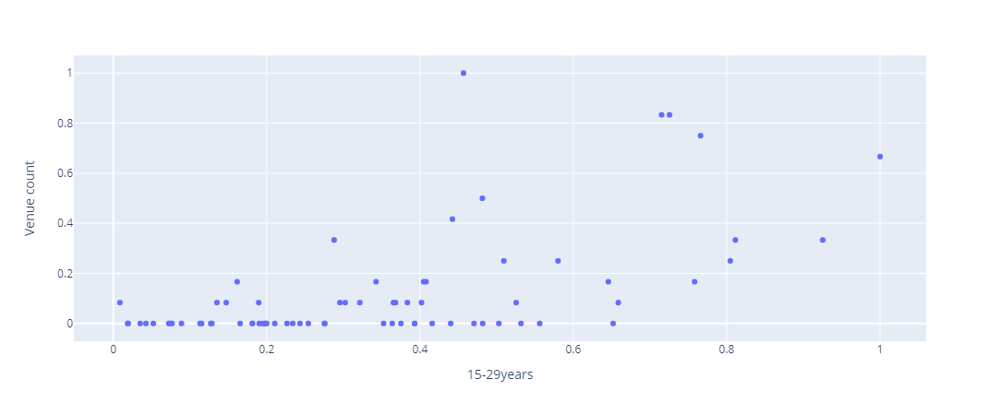

In [17]:
px.scatter(bcn_all_index, x='15-29years', y ='Venue count')

The distribution is very dispersed but there is a certain relationship between the number of green businesses and the number of people between 15 and 29 years old.

## 5.1.- Venues clustering with K-Means.<a name = 2.1></a>

The neighborhoods are grouped by the number and type of businesses in each one. First of all analyze the most common business for each neighbourhood

In [18]:
import random 
import numpy as np 
import pandas as pd 
import folium
import matplotlib.pyplot as plt 
%matplotlib inline 
from sklearn.cluster import KMeans 
pd.options.display.max_columns = 999
pd.options.display.max_rows = 999


In [19]:
bcn_b = pd.read_csv("bcn_bussines.csv") # import the data of the venues. 

First obtain the total number of venue categories for each neighbourhood

In [20]:
# one hot encoding
bcn_venues = pd.get_dummies(bcn_b[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
bcn_venues['Neighbourhood'] = bcn_b['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [bcn_venues.columns[-1]] + list(bcn_venues.columns[:-1])
bcn_venues = bcn_venues[fixed_columns]

bcn_venues.head()

,Neighbourhood,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bistro,Board Shop,Boarding House,Bookstore,Botanical Garden,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Buffet,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Cable Car,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Casino,Castle,Cheese Shop,Chinese Restaurant,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Gym,College Residence Hall,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cooking School,Cosmetics Shop,Country Dance Club,Coworking Space,Creperie,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Ethiopian Restaurant,Event Space,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Latin American Restaurant,Lebanese Restaurant,Light Rail Station,Liquor Store,Lounge,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Memorial Site,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,National Park,Neighborhood,Nightclub,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Racetrack,Ramen Restaurant,Record Shop,Recreation Center,Restaurant,Road,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sauna / Steam Room,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tech Startup,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park Ride / Attraction,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Track,Trail,Train Station,Tram Station,Transportation Service,Tunnel,Turkish Restaurant,University,Vacation Rental,Vegetarian 

The total number of business types for each neighborhood is obtained.

In [21]:
bcn_venues_grouped_s = bcn_venues.groupby('Neighbourhood').sum().reset_index()
bcn_venues_grouped_s.head()

,Neighbourhood,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bistro,Board Shop,Boarding House,Bookstore,Botanical Garden,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Buffet,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Cable Car,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Casino,Castle,Cheese Shop,Chinese Restaurant,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Gym,College Residence Hall,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cooking School,Cosmetics Shop,Country Dance Club,Coworking Space,Creperie,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Ethiopian Restaurant,Event Space,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Latin American Restaurant,Lebanese Restaurant,Light Rail Station,Liquor Store,Lounge,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Memorial Site,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,National Park,Neighborhood,Nightclub,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Racetrack,Ramen Restaurant,Record Shop,Recreation Center,Restaurant,Road,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sauna / Steam Room,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tech Startup,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park Ride / Attraction,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Track,Trail,Train Station,Tram Station,Transportation Service,Tunnel,Turkish Restaurant,University,Vacation Rental,Vegetarian 

The frecuency of bussines type for each neighbourhood is obtained

In [22]:
bcn_venues_grouped = bcn_venues.groupby('Neighbourhood').mean().reset_index()
bcn_venues_grouped.head()

,Neighbourhood,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Basketball Court,Basketball Stadium,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bistro,Board Shop,Boarding House,Bookstore,Botanical Garden,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Buffet,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Cable Car,Cafeteria,Café,Cambodian Restaurant,Camera Store,Candy Store,Casino,Castle,Cheese Shop,Chinese Restaurant,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Gym,College Residence Hall,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cooking School,Cosmetics Shop,Country Dance Club,Coworking Space,Creperie,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Escape Room,Ethiopian Restaurant,Event Space,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hookah Bar,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Latin American Restaurant,Lebanese Restaurant,Light Rail Station,Liquor Store,Lounge,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Memorial Site,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,National Park,Neighborhood,Nightclub,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Paella Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pizza Place,Platform,Playground,Plaza,Polish Restaurant,Pool,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Racetrack,Ramen Restaurant,Record Shop,Recreation Center,Restaurant,Road,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Sauna / Steam Room,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South American Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taco Place,Tapas Restaurant,Tea Room,Tech Startup,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park Ride / Attraction,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Track,Trail,Train Station,Tram Station,Transportation Service,Tunnel,Turkish Restaurant,University,Vacation Rental,Vegetarian 

In [23]:
bcn_venues_grouped.to_csv("bcn_venues_grouped.csv", index = False) # Export the data of the venues gruped for the clustering

### Most common venues for each neighbourhood

Obtain the ten most common venues for the neighbourhoods. 

In [24]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [25]:
num_top_venues = 10
indicators = ['st', 'nd', 'rd']
# create columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
bcn_venues_sorted = pd.DataFrame(columns=columns)
bcn_venues_sorted['Neighbourhood'] = bcn_venues_grouped['Neighbourhood']

for ind in np.arange(bcn_venues_grouped.shape[0]):
    bcn_venues_sorted.iloc[ind, 1:] = return_most_common_venues(bcn_venues_grouped.iloc[ind, :], num_top_venues)

bcn_venues_sorted.head()

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Baix Guinardó,Japanese Restaurant,Tapas Restaurant,Bar,Restaurant,Bakery,Café,Grocery Store,Gym,Supermarket,Breakfast Spot
1,Barrio Gótico,Ice Cream Shop,Tapas Restaurant,Plaza,Italian Restaurant,Bar,Hotel,Mediterranean Restaurant,Spanish Restaurant,Coffee Shop,Pizza Place
2,Baró de Viver,Asian Restaurant,Metro Station,Supermarket,Deli / Bodega,Furniture / Home Store,Dessert Shop,Pet Store,Restaurant,Falafel Restaurant,Farm
3,Camp d'en Grassot i Gràcia Nova,Tapas Restaurant,Bakery,Gym,Japanese Restaurant,Bar,Spanish Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Sushi Restaurant
4,Can Baró,Spanish Restaurant,Scenic Lookout,Tapas Restaurant,Chinese Restaurant,Grocery Store,Italian Restaurant,Soccer Stadium,Soccer Field,Breakfast Spot,Restaurant


### Cluster neighbourhoods by venues. 
Once the venues data for the neighbourhoods were processed, we grouped the neighbourhoods by clusters with K-Means.


In [26]:
bcn_all_venues = pd.read_csv("bcn_venues_grouped.csv") # import the data of venues gruoped by categories. 
bcn_all_venue = pd.read_csv("bcn_all_data_venue.csv")
bcn_all_index = pd.read_csv("bcn_all_index.csv")
bcn_eco_bussines = pd.read_csv("bcn_eco_bussines.csv")

In [27]:
bcn_clustering =  bcn_venues_grouped.drop("Neighbourhood",1) # drop the neighbourhood column

obtain the number of clusters of the model with the **Elbow method**

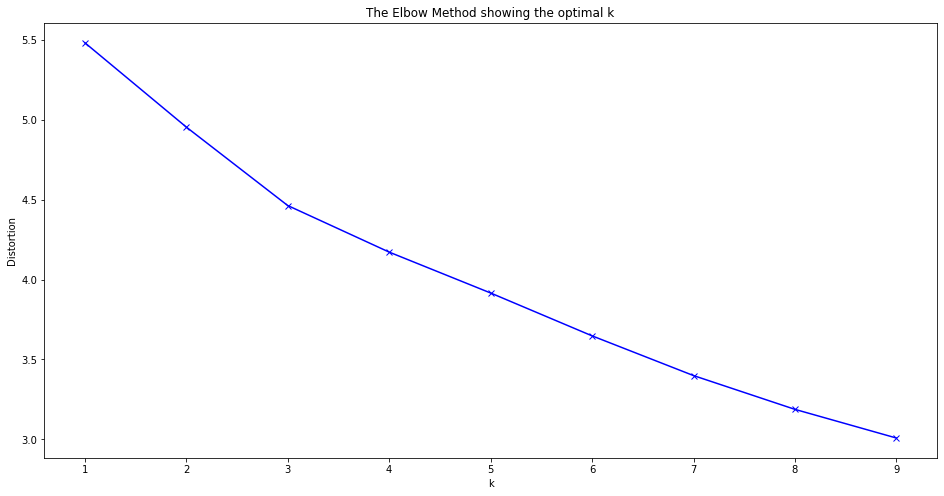

In [28]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0).fit(bcn_clustering)
    distortions.append(kmeanModel.inertia_)
    
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

The number of clusters appropriated are 3.   

In [29]:
K = 3
kmeanModel = KMeans(n_clusters= K).fit(bcn_clustering)

kmeanModel.labels_[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

Obtain the data of each neighbourhood with their cluster label. 

In [30]:
bcn_cluster_bussines = bcn_all_venue.copy()
bcn_cluster_bussines["Cluster Labels"] = kmeanModel.labels_
bcn_cluster_bussines.head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count,Cluster Labels
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368,47353,71.2,5993,10382,14562,9113,4512,2375,416,36330,14.5,8.0,1
1,1,Ciutat Vella,2,Barrio Gótico,41.383395,2.176912,18629,106.1,1425,4742,6147,3382,1829,915,189,17931,7.9,12.0,1
2,1,Ciutat Vella,3,La Barceloneta,41.380653,2.189927,14857,79.6,1146,3140,4503,2774,1788,1310,196,11346,12.9,1.0,1
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",41.388322,2.177411,22590,99.4,2116,4997,7143,4224,2406,1458,246,17817,11.3,6.0,1
4,2,Eixample,5,El Fort Pienc,41.395925,2.182325,32349,106.5,3706,5455,8028,6338,5223,3049,550,22474,7.4,1.0,1


Obtain the normalized data of each neighbourhood with their cluster label.

In [31]:
bcn_cluster_bussines_index = bcn_all_index.copy()
bcn_cluster_bussines_index["Cluster Labels"] = kmeanModel.labels_
bcn_cluster_bussines_index.head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count,Cluster Labels
0,1,Ciutat Vella,1,El Raval,0.997958,0.979444,0.815981,0.286174,0.778413,1.000000,1.000000,0.721365,0.426505,0.401386,0.396568,0.943882,0.843023,0.666667,1
1,1,Ciutat Vella,2,Barrio Gótico,0.998051,0.983303,0.321013,0.426447,0.185089,0.456752,0.422126,0.267712,0.172890,0.154639,0.180172,0.465861,0.459302,1.000000,1
2,1,Ciutat Vella,3,La Barceloneta,0.997985,0.989182,0.256014,0.319936,0.148851,0.302447,0.309230,0.219584,0.169014,0.221396,0.186845,0.294778,0.750000,0.083333,1
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",0.998170,0.983529,0.389268,0.399518,0.274841,0.481314,0.490523,0.334362,0.227432,0.246409,0.234509,0.462899,0.656977,0.500000,1
4,2,Eixample,5,El Fort Pienc,0.998353,0.985748,0.557434,0.428055,0.481361,0.525429,0.551298,0.501702,0.493714,0.515295,0.524309,0.583892,0.430233,0.083333,1


Export the obtained data.

In [32]:
bcn_cluster_bussines.to_csv("bcn_cluster_bussines",index = False)
bcn_cluster_bussines_index.to_csv("bcn_cluster_bussines_index", index = False)

In [33]:
bcn_n_geo = r'barris.geojson' # geojson file


neighbour_map = folium.Map(location=[41.3828939, 2.1774322], zoom_start=11)
neighbour_map.choropleth(
    geo_data=bcn_n_geo,
    data=bcn_all_venue,
    columns=['Neighbourhood', 'Venue count'],
    key_on='feature.properties.NOM',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.5,
    legend_name='Barcelona Best Neighbourhood',
    reset = True
)

color = ["blue", "green","black","red", "black"]
for a in range(0,3):
    for lat, long, bor,Nºneig, neig in zip(bcn_cluster_bussines[bcn_cluster_bussines['Cluster Labels']== a]["latitude"],
                                           bcn_cluster_bussines[bcn_cluster_bussines['Cluster Labels']== a]["longitude"],
                                           bcn_cluster_bussines[bcn_cluster_bussines['Cluster Labels']== a]['Borough'], 
                                           bcn_cluster_bussines[bcn_cluster_bussines['Cluster Labels']== a]['NºNeighbourhood'],
                                           bcn_cluster_bussines[bcn_cluster_bussines['Cluster Labels']== a]['Neighbourhood']):
        label = 'Borough: {}, Neihbourhood: {},{}'.format(bor,Nºneig,neig)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
        [lat, long],
        radius=3,
        popup=label,
        color=color[a],
        fill=True
        ).add_to(neighbour_map)  
    
for lat, long, venue, venuec in zip(bcn_eco_bussines["Venue Latitude"], bcn_eco_bussines["Venue Longitude"],bcn_eco_bussines["Venue"],bcn_eco_bussines["Venue Category"]):
    label = 'Venue: {}, Venue category: {}'.format(venue, venuec)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, long],
        radius=1,
        popup=label,
        color='yellow',
        fill=True
        ).add_to(neighbour_map)  

    

# display map
neighbour_map

Looking at this map, **it is not possible to determine a clear group** of neighborhoods by the type of businesses they own, in general in Spain, neighborhoods tend to have the same type of businesses. Furthermore, the limitation of 100 results per neighborhood reduces any precision.

## 5.2.- Clustering by socieconomic indicators with K-Means  <a name = 2.2></a>  

Cluster the different neighbourhoods by the socioeconomic indicators to determine a relationship between the clusters and number of target venues. 

In [34]:
from sklearn.cluster import KMeans 

In [35]:
bcn_all_index = pd.read_csv("bcn_all_index.csv") # import the normalized data of the socioeconomic indicator.
bcn_all_venue = pd.read_csv("bcn_all_data_venue.csv")
bcn_eco_bussines = pd.read_csv("bcn_eco_bussines.csv")

Keep the columns of indicators and drop the neighbourhoods columns

In [36]:
bcn_all_clustering = bcn_all_index.drop('Neighbourhood', 1).drop('NºBorough',1).drop('NºNeighbourhood',1).drop('Borough',1).drop('latitude',1).drop('longitude',1).drop('Venue count',1)

obtain the number of clusters of the model with the **Elbow method**

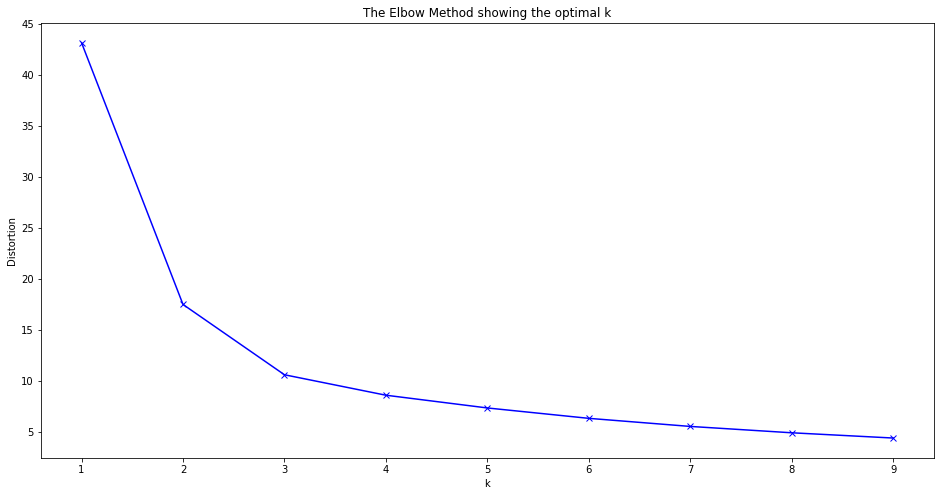

In [37]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(bcn_all_clustering)
    distortions.append(kmeanModel.inertia_)
    
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In this case the appropriated number of clusters are 3, but build the model with 5 clusters to obtain more clusters to analyze. 

In [38]:
kclusters = 5
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(bcn_all_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 2, 2, 2, 4, 3, 3, 3, 3, 1], dtype=int32)

insert the cluster label column in the data frames

In [39]:
#bcn_all_venue.drop('Cluster Labels',1, inplace = True)
bcn_all_venue.insert(0, 'Cluster Labels', kmeans.labels_) # with the data of the neighbourhoods
#bcn_all_index.drop('Cluster Labels',1, inplace = True)
bcn_all_index.insert(0, 'Cluster Labels', kmeans.labels_) # with the normalized data


In [40]:
bcn_all_index.head(1)

,Cluster Labels,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count
0,1,1,Ciutat Vella,1,El Raval,0.997958,0.979444,0.815981,0.286174,0.778413,1.0,1.0,0.721365,0.426505,0.401386,0.396568,0.943882,0.843023,0.666667


Show the number of target venues and neighbourhoods for each cluster. 

In [41]:
for a in range(0,kclusters):
    n_venues = bcn_all_venue[bcn_all_venue['Cluster Labels']== a]['Venue count'].sum()
    n_neig = bcn_all_venue[bcn_all_venue['Cluster Labels']== a]['Neighbourhood'].count()
    print('Cluster: ', a)
    print('nº target venues: ', n_venues, 'Nº Neighbourhoods: ', n_neig )
    print('ratio nºvenues/nºneighbourhoods: ', n_venues/n_neig )

Cluster:  0
nº target venues:  4.0 Nº Neighbourhoods:  19
ratio nºvenues/nºneighbourhoods:  0.21052631578947367
Cluster:  1
nº target venues:  21.0 Nº Neighbourhoods:  8
ratio nºvenues/nºneighbourhoods:  2.625
Cluster:  2
nº target venues:  26.0 Nº Neighbourhoods:  19
ratio nºvenues/nºneighbourhoods:  1.368421052631579
Cluster:  3
nº target venues:  43.0 Nº Neighbourhoods:  8
ratio nºvenues/nºneighbourhoods:  5.375
Cluster:  4
nº target venues:  12.0 Nº Neighbourhoods:  19
ratio nºvenues/nºneighbourhoods:  0.631578947368421


the cluster with highest number of target venues per neighbourhood is the cluster Nº3, 

In [42]:
bcn_all_venue[bcn_all_venue['Cluster Labels']== 3].sort_values("Venue count", ascending = False ).head(8)

,Cluster Labels,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count
6,3,2,Eixample,7,La Derecha del Ensanche,41.394560,2.167998,43515,175.9,5086,7424,10215,8835,6891,4077,987,29535,6.3,10.0
7,3,2,Eixample,8,L'Antiga Esquerra de l'Eixample,41.390000,2.155000,42393,137.2,4558,7532,10458,8421,6496,4021,907,29495,6.6,10.0
30,3,6,Gràcia,31,Vila de Gràcia,41.403178,2.157166,50102,104.4,5828,7951,14454,9712,6860,4353,944,35144,7.5,9.0
5,3,2,Eixample,6,Sagrada Familia,41.403479,2.174410,51385,101.8,5292,8423,12545,10390,8567,5132,1036,35008,7.5,4.0
8,3,2,Eixample,9,La Nova Esquerra de l'Eixample,41.383389,2.149000,58032,110.2,6108,9606,13909,11168,10275,5917,1049,38490,7.4,4.0
25,3,5,Sarrià-Sant Gervasi,26,Sant Gervasi-Galvany,41.397807,2.143385,47588,192.1,6910,8354,8697,10310,7340,5001,976,29947,4.7,3.0
59,3,9,Sant Andreu,60,San Andrés,41.439777,2.190852,57843,77.7,7699,7871,12956,12633,10579,5351,754,37215,9.1,2.0
18,3,4,Les Corts,19,Les Corts,41.385244,2.132863,46274,120.0,5589,6837,9682,8923,9269,5176,798,28434,7.8,1.0


By affinity we see that **the neighborhood of "Les Corts" has characteristics very similar to "La derecha del ensache" but 10 times less businesses**. So it is a good candidate to start a business. The neighbourhood of **"San Andres" too are a good candidate also don't have nearly business to compete**. 

In [43]:
bcn_n_geo = r'barris.geojson' # geojson file


neighbour_map = folium.Map(location=[41.3828939, 2.1774322], zoom_start=11)
neighbour_map.choropleth(
    geo_data=bcn_n_geo,
    data=bcn_all_venue,
    columns=['Neighbourhood', 'Venue count'],
    key_on='feature.properties.NOM',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.5,
    legend_name='Venue count',
    reset = True
)

color = ["blue", "green","orange","red", "black"]
for a in range(0,5):
    for lat, long, bor,Nºneig, neig in zip( bcn_all_venue[bcn_all_venue['Cluster Labels']== a]["latitude"],bcn_all_venue[bcn_all_venue['Cluster Labels']== a]["longitude"],bcn_all_venue[bcn_all_venue['Cluster Labels']== a]['Borough'], bcn_all_venue[bcn_all_venue['Cluster Labels']== a]['NºNeighbourhood'], bcn_all_venue[bcn_all_venue['Cluster Labels']== a]['Neighbourhood']):
        label = 'Cluster: {}, Borough: {}, Neihbourhood: {},{}'.format(a, bor,Nºneig,neig)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
        [lat, long],
        radius=3,
        popup=label,
        color=color[a],
        fill=True
        ).add_to(neighbour_map)  
    
for lat, long, venue, venuec in zip(bcn_eco_bussines["Venue Latitude"], bcn_eco_bussines["Venue Longitude"],bcn_eco_bussines["Venue"],bcn_eco_bussines["Venue Category"]):
    label = 'Venue: {}, Venue category: {}'.format(venue, venuec)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, long],
        radius=1,
        popup=label,
        color='yellow',
        fill=True
        ).add_to(neighbour_map)  

    

# display map
neighbour_map

We can see that the clusters with higher number of target venues( cluster 3-RED and 1-GREEN) are principally located in the center zones. Instead the rest of the neighbourhoods with less number of target venues are located around the center of Barcelona. It is determined that **the neighborhoods in the central areas have more possibilities of having a green business**. But it does not have to be related to socioeconomic indicators. Perhaps the central area of the city is the reason for the high number of businesses as is logical.

In [44]:
bcn_all_venue.to_csv("bcn_final_cluster.csv", index = False)

## 5.3.- Best neighborhoods applying weighted factors <a name = 2.3></a>

It is interesting to analyze the neighborhoods by the indicators that interest us the most. A score is obtained for each neighborhood by giving each variable a weight. These weights come from market research or intuition itself. For example, ecological trends have a greater impact on young people, so we will give more weight to the young population.

In [45]:
import folium 

In [46]:
bcn_all_index = pd.read_csv("bcn_all_data_normalized.csv")
bcn_eco_bussines = pd.read_csv("bcn_eco_bussines.csv")
bcn_all_venue = pd.read_csv("bcn_all_data_venue.csv")

To obtain a score for each neighborhood, we introduce a multiplication factor for each variable. We give more space to young groups and neighborhoods with high incomes. On the other hand, since we are not interested in unemployment or competition, we introduce a negative multiplier factor.

In [47]:
# pesos 

best_neighbourhood = pd.DataFrame(columns=["Neighbourhood", "Score"])

pop = 0
RFD = 0.5
years_0_14 = -1
years_15_29 =2
years_30_44 =2
years_45_59 =0.4
years_60_74 =0.3
years_75_89 =0.1
years_90 =0.8
can_work_population = 0
unemployement_rate = -0.3
buss = -1

best_neighbourhood["Neighbourhood"] = bcn_all_index["Neighbourhood"]
best_neighbourhood["Score"] = (
    bcn_all_index["Population"]*pop+
    bcn_all_index["RFD"]*RFD +
    bcn_all_index["0-14years"]*years_0_14 +
    bcn_all_index["15-29years"]*years_15_29+
    bcn_all_index["30-44years"]*years_30_44+
    bcn_all_index["45-59years"]*years_45_59+
    bcn_all_index["60-74years"]*years_60_74+
    bcn_all_index["75-89years"]*years_75_89+
    bcn_all_index[">=90years"]*years_90+
    bcn_all_index["can work population"]*can_work_population+
    bcn_all_index["unemployement rate"]*unemployement_rate +
    bcn_all_index["Venue count"]*buss
  )
best_neighbourhood.sort_values("Score", ascending = False).head()

,Neighbourhood,Score
8,La Nova Esquerra de l'Eixample,4.271528
5,Sagrada Familia,3.847409
59,San Andrés,3.491924
30,Vila de Gràcia,3.384408
25,Sant Gervasi-Galvany,3.323802


Introduce the score obtained to the neighbourhoods data

In [48]:
bcn_final = bcn_all_venue.join(best_neighbourhood.set_index('Neighbourhood'), on='Neighbourhood', how='inner')
bcn_final.head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count,Score
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368,47353,71.2,5993,10382,14562,9113,4512,2375,416,36330,14.5,8.0,3.218991
1,1,Ciutat Vella,2,Barrio Gótico,41.383395,2.176912,18629,106.1,1425,4742,6147,3382,1829,915,189,17931,7.9,12.0,0.966653
2,1,Ciutat Vella,3,La Barceloneta,41.380653,2.189927,14857,79.6,1146,3140,4503,2774,1788,1310,196,11346,12.9,1.0,1.236289
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",41.388322,2.177411,22590,99.4,2116,4997,7143,4224,2406,1458,246,17817,11.3,6.0,1.585722
4,2,Eixample,5,El Fort Pienc,41.395925,2.182325,32349,106.5,3706,5455,8028,6338,5223,3049,550,22474,7.4,1.0,2.493488


In [49]:
bcn_n_geo = r'barris.geojson' # geojson file


neighbour_map = folium.Map(location=[41.3828939, 2.1774322], zoom_start=11)
neighbour_map.choropleth(
    geo_data=bcn_n_geo,
    data=bcn_final,
    columns=['Neighbourhood', 'Score'],
    key_on='feature.properties.NOM',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.5,
    legend_name='Barcelona Best Neighbourhood',
    reset = True
)

for lat, long, bor,Nºneig, neig,Score in zip(bcn_final["latitude"],bcn_final["longitude"],bcn_final['Borough'], bcn_final['NºNeighbourhood'], bcn_final['Neighbourhood'],bcn_final['Score']):
    label = 'Borough: {}, Neihbourhood: {},{}, Score:{}'.format(bor,Nºneig,neig,Score)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, long],
        radius=2,
        popup=label,
        color='blue',
        fill=True
        ).add_to(neighbour_map)  
    
for lat, long, venue, venuec in zip(bcn_eco_bussines["Venue Latitude"], bcn_eco_bussines["Venue Longitude"],bcn_eco_bussines["Venue"],bcn_eco_bussines["Venue Category"]):
    label = 'Venue: {}, Venue category: {}'.format(venue, venuec)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, long],
        radius=1,
        popup=label,
        color='yellow',
        fill=True
        ).add_to(neighbour_map)  

    

# display map
neighbour_map

Giving a value to the variables that define each neighborhood, we see with the color scale that the neighborhoods with the highest scores are those in the center of Barcelona. You can see how to some extent there is a relationship between the trends we have chosen and the number of green businesses. You can see some **neighborhoods with high scores and few businesses**. These areas are interesting to open a business according to the priority we have given to the indicators.

In [50]:
bcn_final.sort_values("Score", ascending = False).head(8)

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count,Score
8,2,Eixample,9,La Nova Esquerra de l'Eixample,41.383389,2.149000,58032,110.2,6108,9606,13909,11168,10275,5917,1049,38490,7.4,4.0,4.271528
5,2,Eixample,6,Sagrada Familia,41.403479,2.174410,51385,101.8,5292,8423,12545,10390,8567,5132,1036,35008,7.5,4.0,3.847409
59,9,Sant Andreu,60,San Andrés,41.439777,2.190852,57843,77.7,7699,7871,12956,12633,10579,5351,754,37215,9.1,2.0,3.491924
30,6,Gràcia,31,Vila de Gràcia,41.403178,2.157166,50102,104.4,5828,7951,14454,9712,6860,4353,944,35144,7.5,9.0,3.384408
25,5,Sarrià-Sant Gervasi,26,Sant Gervasi-Galvany,41.397807,2.143385,47588,192.1,6910,8354,8697,10310,7340,5001,976,29947,4.7,3.0,3.323802
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368,47353,71.2,5993,10382,14562,9113,4512,2375,416,36330,14.5,8.0,3.218991
18,4,Les Corts,19,Les Corts,41.385244,2.132863,46274,120.0,5589,6837,9682,8923,9269,5176,798,28434,7.8,1.0,3.184126
10,3,Sants-Montjuïc,11,Poble Sec,41.369717,2.158336,39995,82.2,4569,6768,11789,8209,5057,3144,459,28752,10.8,0.0,3.112820


The neighbourhoods of **San Andrés, les corts and Poble Sec** are the zones with high interest according the selected factors and less numbers of target venues. 

The neighbourhoods with **highest score are La Nova "Esquerra de l'Eixample" and the "Sagrada Familia"**

In [51]:
bcn_final.to_csv("bcn_final_factors.csv", index = False)

## 5.4.- Multiple linear regresion with socieconomic indicators<a name = 2.4></a>

A multiple linear regression is performed to obtain the correlation between the variables and the target value. In this case we want to obtain the relationship between the socioeconomic indicators and the number of businesses in each neighborhood, to see if there is any direct relationship.

In [52]:
import plotly.express as px
import pandas as pd
import folium

Import the necessary data 

In [53]:
bcn_all_index = pd.read_csv("bcn_all_data_normalized.csv") #normalized values of neighbourhoods characteristics. 
bcn_all_venue_MLR = pd.read_csv("bcn_all_data_venue.csv")  # Data of neighbourhoods. 

Create the linear regression model with scikit-learn. 

In [54]:
from sklearn import linear_model
regr = linear_model.LinearRegression()
x = bcn_all_index[["RFD","0-14years","15-29years","30-44years","45-59years","60-74years","75-89years",">=90years","unemployement rate"]]
y = bcn_all_index[["Venue count"]]
regr.fit (x, y)

print ('Coefficients: ', regr.coef_)
print('Intercept: ' ,regr.intercept_[0])




Coefficients:  [[ 0.15904428 -0.9113385   0.85073919  0.35354303  0.62488043 -0.12775956
  -1.14228901  0.72314419  0.03127055]]
Intercept:  -0.059267804661830084


We relate the coefficients with the different parameters.

In [55]:
Factores = ["RFD","0-14years","15-29years","30-44years","45-59years","60-74years","75-89years",">=90years","unemployement rate"]
factores = {}
for a in range(0,len(Factores)):
    #print(Factores[a],": ", regr.coef_[0][a] )
    factores.update({ Factores[a] : regr.coef_[0][a]})

In [56]:
Parameters = pd.DataFrame(Factores)
Parameters.columns = ["Parameter"]
Parameters["coef"] = regr.coef_[0]
Parameters = Parameters.sort_values("coef", ascending = True)
Parameters

,Parameter,coef
6,75-89years,-1.142289
1,0-14years,-0.911339
5,60-74years,-0.127760
8,unemployement rate,0.031271
0,RFD,0.159044
3,30-44years,0.353543
4,45-59years,0.624880
7,>=90years,0.723144
2,15-29years,0.850739


In [57]:
Parameters.to_csv("MLR_coef.csv", index = False)

After obtaining the coefficients we can see how the age group of 15 to 19 years is the one that has the greatest relationship with the number of ecological businesses

Represent the coefficients for each variable in a bar chart

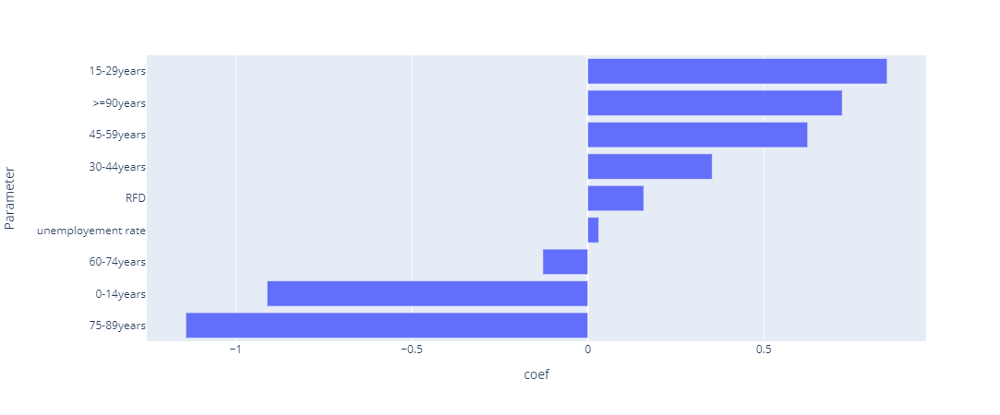

In [58]:
px.bar(Parameters, x = "coef", y = "Parameter",orientation = 'h')

Also a polar chart is a good representation to see the weight of the coefficients. 

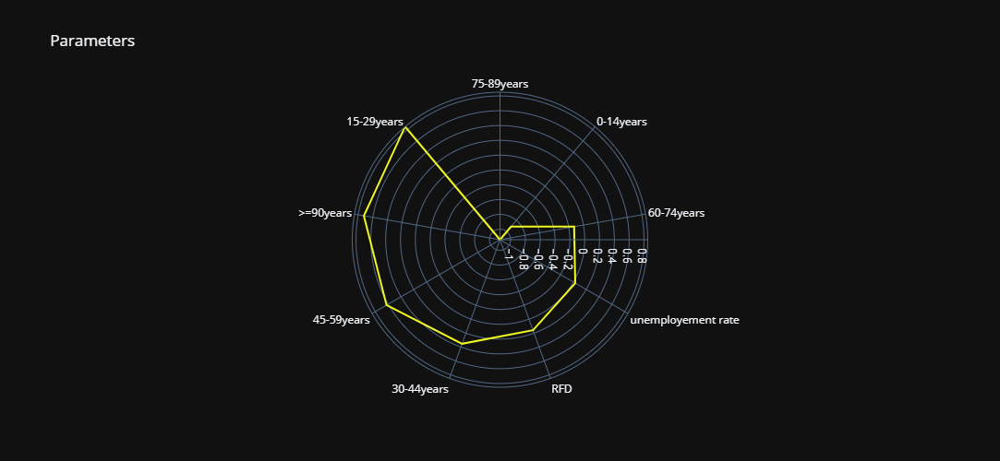

In [59]:
fig = px.line_polar(Parameters , r="coef", theta="Parameter", line_close=True,
                    color_discrete_sequence=px.colors.sequential.Plasma_r,
                    template="plotly_dark",
                    title = "Parameters",
                    width = 600, 
                    height = 500)
fig.show()

Multiplying the coefficients by the values ​​of each variable we obtain the prediction for each neighborhood.
**It would be more correct to use sklearn to obtain the prediction** for each neighborhood. But since we are interested in knowing which neighborhoods are more important multiplying the coefficients for each variable provides us with this information, we are interested in calculating it this way because we **can modify the coefficients** or give a negative coefficient to the variable of number of businesses.

In [60]:
best_neighbourhood = pd.DataFrame(columns=["Neighbourhood", "Score"])

pop = 0
RFD = factores.get("RFD")
years_0_14 = factores.get("0-14years")
years_15_29 = factores.get("15-29years")
years_30_44 = factores.get("30-44years")
years_45_59 = factores.get("45-59years")
years_60_74 = factores.get("60-74years")
years_75_89 = factores.get("75-89years")
years_90 = factores.get(">=90years")
can_work_population = 0
unemployement_rate = factores.get("unemployement rate")
buss = -0 

best_neighbourhood["Neighbourhood"] = bcn_all_index["Neighbourhood"]
best_neighbourhood["Score"] = (
    bcn_all_index["Population"]*pop +
    bcn_all_index["RFD"]*RFD +
    bcn_all_index["0-14years"]*years_0_14 +
    bcn_all_index["15-29years"]*years_15_29+
    bcn_all_index["30-44years"]*years_30_44+
    bcn_all_index["45-59years"]*years_45_59+
    bcn_all_index["60-74years"]*years_60_74+
    bcn_all_index["75-89years"]*years_75_89+
    bcn_all_index[">=90years"]*years_90+
    bcn_all_index["can work population"]*can_work_population +
    bcn_all_index["unemployement rate"]*unemployement_rate +
    bcn_all_index["Venue count"]*buss)

#best_neighbourhood.sort_values("Score", ascending = False).head()


In [61]:
best_neighbourhood["Venue count"] = bcn_all_venue_MLR["Venue count"]
best_neighbourhood.sort_values("Score", ascending = False).head()

,Neighbourhood,Score,Venue count
0,El Raval,0.791315,8.0
6,La Derecha del Ensanche,0.625342,10.0
7,L'Antiga Esquerra de l'Eixample,0.618352,10.0
30,Vila de Gràcia,0.600916,9.0
5,Sagrada Familia,0.580987,4.0


Representing graphically the relationship between the forecast and the number of businesses, the trend is appreciated.

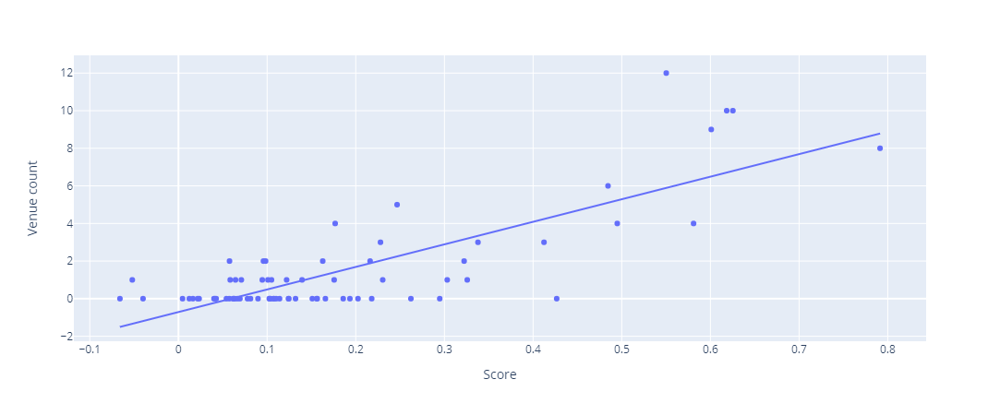

In [62]:
px.scatter(best_neighbourhood, x =  "Score", y = "Venue count", trendline = "ols")

In [63]:
from sklearn.metrics import r2_score
y_pred = regr.predict(x)
r2_score(y,y_pred)

0.6470742413400716

The R squared value shows a relationship between the prediction and the actual values. Since businesses are based on many variables and are largely determined by trade or downtown areas, this is not a bad R-squared value.

In [64]:
bcn_n_geo = r'barris.geojson' # geojson file


neighbour_map = folium.Map(location=[41.3828939, 2.1774322], zoom_start=11)
neighbour_map.choropleth(
    geo_data=bcn_n_geo,
    data=best_neighbourhood,
    columns=['Neighbourhood', 'Score'],
    key_on='feature.properties.NOM',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.5,
    legend_name='Barcelona Best Neighbourhood',
    reset = True
)

for lat, long, bor,Nºneig, neig,Score in zip(bcn_all_venue_MLR["latitude"],
                                             bcn_all_venue_MLR["longitude"],
                                             bcn_all_venue_MLR['Borough'], 
                                             bcn_all_venue_MLR['NºNeighbourhood'],
                                             bcn_all_venue_MLR['Neighbourhood'],
                                             best_neighbourhood['Score']):
    label = 'Borough: {}, Neihbourhood: {},{}, Score:{}'.format(bor,Nºneig,neig,Score)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, long],
        radius=2,
        popup=label,
        color='blue',
        fill=True
        ).add_to(neighbour_map)  
    
for lat, long, venue, venuec in zip(bcn_eco_bussines["Venue Latitude"], bcn_eco_bussines["Venue Longitude"],bcn_eco_bussines["Venue"],bcn_eco_bussines["Venue Category"]):
    label = 'Venue: {}, Venue category: {}'.format(venue, venuec)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, long],
        radius=1,
        popup=label,
        color='yellow',
        fill=True
        ).add_to(neighbour_map)  

    

# display map
neighbour_map

Following the trend of the rest of the analysis, it is seen that the neighborhoods with the highest prediction of the number of businesses are grouped in the central area of ​​Barcelona.

### Number of target venues predicted by neighbourhood. 

With the multiple linear regression carried out, it is possible to obtain the prediction of the number of businesses that there should be per neighbourhood. With this **prediction and the actual amount we can see which neighbourhoods could acquire more businesses**.

In [65]:
y_pred
best_neighbourhood["Predict"] = pd.DataFrame(y_pred)*best_neighbourhood["Venue count"].max()
best_neighbourhood["Predict - real"] =  best_neighbourhood["Predict"] - best_neighbourhood["Venue count"]
best_neighbourhood.sort_values("Predict - real", ascending = False).head(5)

,Neighbourhood,Score,Venue count,Predict,Predict - real
10,Poble Sec,0.426600,0.0,4.407981,4.407981
63,El Camp de l'Arpa del Clot,0.294700,0.0,2.825188,2.825188
26,El Putxet i Farró,0.262169,0.0,2.434815,2.434815
5,Sagrada Familia,0.580987,4.0,6.260624,2.260624
4,El Fort Pienc,0.325723,1.0,3.197459,2.197459


We see that the **Poble sec neighbourhood has 0 businesses but a prediction of 4**. It is seen that this neighborhood is close to the downtown area and also has a high score in the analysis by weighted factors.

Finally, we visualize the neighborhoods with the highest prediction.

In [66]:
bcn_final_MLR = bcn_all_venue_MLR.copy()
bcn_final_MLR["Score"] = best_neighbourhood["Score"]
bcn_final_MLR.sort_values("Score", ascending = False).head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count,Score
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368,47353,71.2,5993,10382,14562,9113,4512,2375,416,36330,14.5,8.0,0.791315
6,2,Eixample,7,La Derecha del Ensanche,41.394560,2.167998,43515,175.9,5086,7424,10215,8835,6891,4077,987,29535,6.3,10.0,0.625342
7,2,Eixample,8,L'Antiga Esquerra de l'Eixample,41.390000,2.155000,42393,137.2,4558,7532,10458,8421,6496,4021,907,29495,6.6,10.0,0.618352
30,6,Gràcia,31,Vila de Gràcia,41.403178,2.157166,50102,104.4,5828,7951,14454,9712,6860,4353,944,35144,7.5,9.0,0.600916
5,2,Eixample,6,Sagrada Familia,41.403479,2.174410,51385,101.8,5292,8423,12545,10390,8567,5132,1036,35008,7.5,4.0,0.580987


In [67]:
bcn_final_MLR.to_csv("bcn_final_MLR.csv", index = False)# export the Multiple linear regression data

# 6.- Results <a name = resultados></a>

Once the methods have been applied to analyze the data, the conclusions of each method are reviewed and analyzed together.

In [68]:
import pandas as pd 
import numpy as np
import plotly.express as px
import folium

In [69]:
bcn_all_index = pd.read_csv("bcn_all_data_normalized.csv")
bcn_final_MLR = pd.read_csv("bcn_final_MLR.csv")
bcn_final_cluster = pd.read_csv("bcn_final_cluster.csv")
bcn_final_MLR_coef= pd.read_csv("MLR_coef.csv")
bcn_final_wf = pd.read_csv("bcn_final_factors.csv")
bcn_eco_bussines  =pd.read_csv("bcn_eco_bussines.csv")

## Clustering by venues 

In the analysis by the venues categories we **can't extract any insight**, maybe the results obtained with foursquare are to short for a precise clustering. In general we can conclude Barcelona have center zones with a high quantity of business. Can be may interesting obtain all the business data without limitations to cluster by business.  

## Clustering by neighbourhoods 

clustering the neighbourhoods in five clusters we can see that the cluster 3 have target venues:  43.0 in 8  Neighbourhoods, with a density (nºvenues/nºneighbourhoods) of  5.375. This type of neighbourhoods are highly interesting for our analysis. 

This neighbourhoods are characterized by middle unemployment rates, population between 40.000 and 60.000 persons and a normal values of rent per capita. 


In [70]:
bcn_final_cluster[bcn_final_cluster['Cluster Labels']== 3].sort_values("Venue count", ascending = False ).head(8)

,Cluster Labels,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count
6,3,2,Eixample,7,La Derecha del Ensanche,41.394560,2.167998,43515,175.9,5086,7424,10215,8835,6891,4077,987,29535,6.3,10.0
7,3,2,Eixample,8,L'Antiga Esquerra de l'Eixample,41.390000,2.155000,42393,137.2,4558,7532,10458,8421,6496,4021,907,29495,6.6,10.0
30,3,6,Gràcia,31,Vila de Gràcia,41.403178,2.157166,50102,104.4,5828,7951,14454,9712,6860,4353,944,35144,7.5,9.0
5,3,2,Eixample,6,Sagrada Familia,41.403479,2.174410,51385,101.8,5292,8423,12545,10390,8567,5132,1036,35008,7.5,4.0
8,3,2,Eixample,9,La Nova Esquerra de l'Eixample,41.383389,2.149000,58032,110.2,6108,9606,13909,11168,10275,5917,1049,38490,7.4,4.0
25,3,5,Sarrià-Sant Gervasi,26,Sant Gervasi-Galvany,41.397807,2.143385,47588,192.1,6910,8354,8697,10310,7340,5001,976,29947,4.7,3.0
59,3,9,Sant Andreu,60,San Andrés,41.439777,2.190852,57843,77.7,7699,7871,12956,12633,10579,5351,754,37215,9.1,2.0
18,3,4,Les Corts,19,Les Corts,41.385244,2.132863,46274,120.0,5589,6837,9682,8923,9269,5176,798,28434,7.8,1.0


By affinity we see that **the neighborhood of "Les Corts" has characteristics very similar to "La derecha del ensache" but 10 times less businesses**. So it is a good candidate to start a business. The neighbourhood of **"San Andres" too are a good candidate also don't have nearly business to compete**. 

## Multiple linear regression 

With multiple linear regression obtain the weights of analyzed factors. The young and the old people are the most influential in the number of venues. The Rent per capt and the unemployment rate aren't very important. The very children have a negative influential. 

In [71]:
bcn_final_MLR_coef

,Parameter,coef
0,75-89years,-1.142289
1,0-14years,-0.911339
2,60-74years,-0.127760
3,unemployement rate,0.031271
4,RFD,0.159044
5,30-44years,0.353543
6,45-59years,0.624880
7,>=90years,0.723144
8,15-29years,0.850739


With the multiple linear regression carried out, it is possible to obtain the prediction of the number of businesses that there should be per neighbourhood. With this prediction and the actual amount we can see which neighbourhoods could acquire more businesses.

In [72]:
bcn_final_MLR
bcn_final_MLR["Predict"] = pd.DataFrame(y_pred)*bcn_final_MLR["Venue count"].max()
bcn_final_MLR["Predict - real"] =  bcn_final_MLR["Predict"] - bcn_final_MLR["Venue count"]
bcn_final_MLR.sort_values("Predict - real", ascending = False).head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count,Score,Predict,Predict - real
10,3,Sants-Montjuïc,11,Poble Sec,41.369717,2.158336,39995,82.2,4569,6768,11789,8209,5057,3144,459,28752,10.8,0.0,0.426600,4.407981,4.407981
63,10,Sant Martí,64,El Camp de l'Arpa del Clot,41.410754,2.182816,38663,81.7,4206,5774,9649,7764,6793,3821,656,25714,9.0,0.0,0.294700,2.825188,2.825188
26,5,Sarrià-Sant Gervasi,27,El Putxet i Farró,41.407317,2.143424,29563,144.6,4125,5002,6365,6115,4733,2703,520,19519,6.4,0.0,0.262169,2.434815,2.434815
5,2,Eixample,6,Sagrada Familia,41.403479,2.174410,51385,101.8,5292,8423,12545,10390,8567,5132,1036,35008,7.5,4.0,0.580987,6.260624,2.260624
4,2,Eixample,5,El Fort Pienc,41.395925,2.182325,32349,106.5,3706,5455,8028,6338,5223,3049,550,22474,7.4,1.0,0.325723,3.197459,2.197459


We see that the **Poble sec neighbourhood has 0 businesses but a prediction of 4**. It is seen that this neighborhood is close to the downtown area and also has a high score in the analysis by weighted factors.

## Relationship between clustering and multiple linear regression 



The number of businesses and the value obtained from the regression by neighborhood are obtained for each cluster and they are divided by the total number of neighborhoods for each cluster. In this way, an average or a trend is obtained by grouping by clusters.

In [73]:
bcn_final_MLR = pd.read_csv("bcn_final_MLR.csv")
bcn_final_cluster = pd.read_csv("bcn_final_cluster.csv")

bcn_analysis = bcn_final_cluster.copy()

bcn_analysis["Score"] = bcn_final_MLR["Score"]
bcn_analysis.head(1)

,Cluster Labels,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count,Score
0,1,1,Ciutat Vella,1,El Raval,41.379518,2.168368,47353,71.2,5993,10382,14562,9113,4512,2375,416,36330,14.5,8.0,0.791315


Obtain the scores and the number of target venues and divide for the number of neighbourhoods in each cluster. 

In [74]:
Venues = []
Score = []
Cluster = []
ven_sco = pd.DataFrame(columns = ["Venues", "Score","Cluster"])
for a in range(0,5):
    Cluster.append(a)
    Venues.append(bcn_analysis[bcn_analysis['Cluster Labels']== a]["Venue count"].sum()/bcn_analysis[bcn_analysis['Cluster Labels']== a]["Venue count"].count())
    Score.append(bcn_analysis[bcn_analysis['Cluster Labels']== a]["Score"].sum()/bcn_analysis[bcn_analysis['Cluster Labels']== a]["Venue count"].count())

ven_sco["Score"]= Score
ven_sco["Venues"]= Venues    
ven_sco["Cluster"] = Cluster

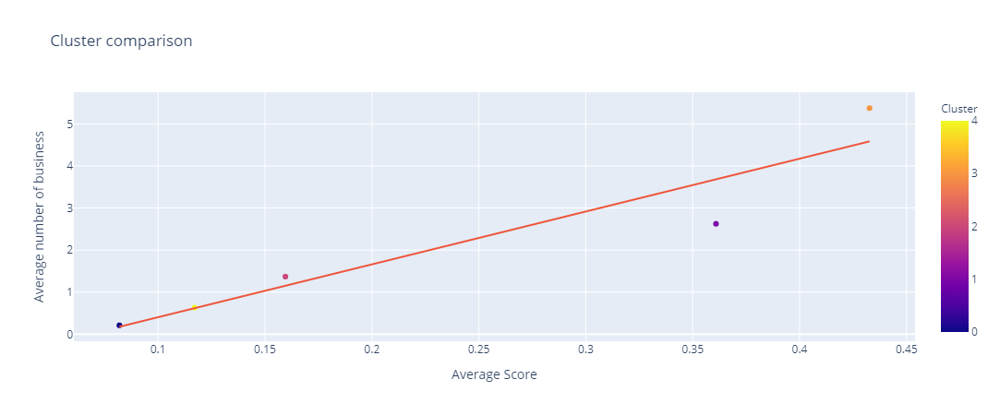

In [76]:
px.scatter(ven_sco, x="Score",y="Venues",color = "Cluster",  labels={
                     "Score": "Average Score",
                     "Venues": "Average number of business",
                     "Cluster": "Cluster"
                 },title = "Cluster comparison",  trendline = "ols" ,color_discrete_sequence = True)

The clusters have a relationship with the MLR prediction, this relationships are the averages values of prediction and number of venues. 
We can see that the **cluster 1** with average score of 0.36 is under the regression line, namely the cluster 1 need more venues to achieve the regression line. 

In [77]:
ven_sco.drop("Cluster", axis = 1).corr().head(1)

,Venues,Score
Venues,1.0,0.946642


Although there are few points to analyze, the relationship between the mean of business numbers and the score is close to 1. This result highlights a very definite relationship. So cluster 1 has less business than it should.

Analyze the number of the venues and the total number of neighbourhoods for each cluster. 

In [78]:
for a in range(0,5):
    n_venues = bcn_analysis[bcn_analysis['Cluster Labels']== a]['Venue count'].sum()
    n_neig = bcn_analysis[bcn_analysis['Cluster Labels']== a]['Neighbourhood'].count()
    print('Cluster: ', a)
    print('nº target venues: ', n_venues, 'Nº Neighbourhoods: ', n_neig )
    print('ratio nºvenues/nºneighbourhoods: ', n_venues/n_neig )

Cluster:  0
nº target venues:  4.0 Nº Neighbourhoods:  19
ratio nºvenues/nºneighbourhoods:  0.21052631578947367
Cluster:  1
nº target venues:  21.0 Nº Neighbourhoods:  8
ratio nºvenues/nºneighbourhoods:  2.625
Cluster:  2
nº target venues:  26.0 Nº Neighbourhoods:  19
ratio nºvenues/nºneighbourhoods:  1.368421052631579
Cluster:  3
nº target venues:  43.0 Nº Neighbourhoods:  8
ratio nºvenues/nºneighbourhoods:  5.375
Cluster:  4
nº target venues:  12.0 Nº Neighbourhoods:  19
ratio nºvenues/nºneighbourhoods:  0.631578947368421


The cluster 1 have the same number of neighbourhoods but the half of target business. It is interesting to analyze this cluster in case there are neighborhoods with the characteristics sought.

In [79]:
bcn_analysis[bcn_analysis['Cluster Labels']== 1].sort_values("Score", ascending = False)

,Cluster Labels,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count,Score
0,1,1,Ciutat Vella,1,El Raval,41.379518,2.168368,47353,71.2,5993,10382,14562,9113,4512,2375,416,36330,14.5,8.0,0.791315
10,1,3,Sants-Montjuïc,11,Poble Sec,41.369717,2.158336,39995,82.2,4569,6768,11789,8209,5057,3144,459,28752,10.8,0.0,0.426600
9,1,2,Eixample,10,Sant Antoni,41.378412,2.161768,38236,104.2,3987,6022,9718,7795,5876,4053,785,26125,8.2,3.0,0.412297
17,1,3,Sants-Montjuïc,18,Sants,41.375329,2.134912,42005,99.0,4807,6703,10691,8540,6558,4059,647,29727,7.4,2.0,0.322205
63,1,10,Sant Martí,64,El Camp de l'Arpa del Clot,41.410754,2.182816,38663,81.7,4206,5774,9649,7764,6793,3821,656,25714,9.0,0.0,0.294700
67,1,10,Sant Martí,68,Poble Nou,41.400527,2.201729,33861,99.9,5288,4592,8856,7880,4318,2439,488,23221,7.8,5.0,0.246577
31,1,6,Gràcia,32,Camp d'en Grassot i Gràcia Nova,41.404589,2.166781,34911,105.7,4031,5288,8424,6797,6174,3591,606,22813,7.4,3.0,0.227860
34,1,7,Horta - Guinardó,35,El Guinardó,41.417733,2.173632,37047,79.1,4576,5520,8735,7880,5903,3850,583,24437,8.4,0.0,0.165710


Looking at the neighborhoods, it is determined that **Poble sec** is the neighborhood with the least businesses and the best score.

## Neighbourhoods indicators cluster and Multiple linear regresion

After analyzing the relationship between the multiple linear regression and cluster methods, we analyze both results graphically to establish the results obtained.

In [80]:
bcn_n_geo = r'barris.geojson' # geojson file


neighbour_map = folium.Map(location=[41.3828939, 2.1774322], zoom_start=11)
neighbour_map.choropleth(
    geo_data=bcn_n_geo,
    data=bcn_final_MLR,
    columns=['Neighbourhood', 'Score'],
    key_on='feature.properties.NOM',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.5,
    legend_name='Barcelona Best Neighbourhood',
    reset = True
)

color = ["blue", "green","orange","red", "black"]
for a in range(0,5):
    for lat, long, bor,Nºneig, neig,score in zip( bcn_final_cluster[bcn_final_cluster['Cluster Labels']== a]["latitude"],
                                           bcn_final_cluster[bcn_final_cluster['Cluster Labels']== a]["longitude"],
                                           bcn_final_cluster[bcn_final_cluster['Cluster Labels']== a]['Borough'],
                                           bcn_final_cluster[bcn_final_cluster['Cluster Labels']== a]['NºNeighbourhood'], 
                                           bcn_final_cluster[bcn_final_cluster['Cluster Labels']== a]['Neighbourhood'],
                                           bcn_analysis[bcn_analysis['Cluster Labels']== a]['Score']):
        label = 'Cluster: {}, Borough: {}, Neihbourhood: {},{}, Score:{}'.format(a, bor,Nºneig,neig,score)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
        [lat, long],
        radius=3,
        popup=label,
        color=color[a],
        fill=True
        ).add_to(neighbour_map)  
    
for lat, long, venue, venuec in zip(bcn_eco_bussines["Venue Latitude"], bcn_eco_bussines["Venue Longitude"],bcn_eco_bussines["Venue"],bcn_eco_bussines["Venue Category"]):
    label = 'Venue: {}, Venue category: {}'.format(venue, venuec)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, long],
        radius=1,
        popup=label,
        color='yellow',
        fill=True
        ).add_to(neighbour_map)  

    

# display map
neighbour_map

The best clusters are the 3(Red) and 1(Green). If don't want any business around the **Poble Sec** are the best option, also is close to the downtown area.

## Best neighbourhoods mixed different analysis 

**Custer by neighbourhood indicators**
By affinity we see that the neighborhood of **"Les Corts"** has characteristics very similar to "La derecha del ensache" but 10 times less businesses. So it is a good candidate to start a business. The neighbourhood of **"San Andres"** too are a good candidate also don't have nearly business to compete. The neighbourhood **Sant Gervasi-Galvany** content in the same cluster have a high RFD indicator, this may be interesting if want a gourmet products. 

**Multiple linear regression analysis**

We see that the **Poble sec** neighbourhood has 0 businesses but a prediction of 4. It is seen that this neighborhood is close to the downtown area and also has a high score in the analysis by weighted factors.

**Weighted factors**
The neighbourhoods of **San Andrés, les corts and Poble Sec** are the zones with high interest according the selected factors and less numbers of target venues. 

**Multiple linear regression and cluster**
If don't want any business around the Poble Sec are the best option, also is close to the downtown area.


In [81]:
polar = bcn_all_index[["Neighbourhood","RFD","0-14years","15-29years","30-44years","45-59years","60-74years","75-89years",">=90years","unemployement rate","Venue count"]].copy()
polar["Score"] = bcn_final_MLR["Score"].round(3)
polar["cluster"] = bcn_final_cluster["Cluster Labels"]
polar = polar.iloc[[18,59,10,25]]
polar.head()

,Neighbourhood,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,unemployement rate,Venue count,Score,cluster
18,Les Corts,0.482315,0.725938,0.658544,0.664881,0.706325,0.876170,0.874768,0.760724,0.453488,0.083333,0.105,3
59,San Andrés,0.312299,1.000000,0.758139,0.889713,1.000000,1.000000,0.904343,0.718780,0.529070,0.166667,0.098,3
10,Poble Sec,0.330386,0.593454,0.651898,0.809573,0.649806,0.478022,0.531350,0.437560,0.627907,0.000000,0.427,1
25,Sant Gervasi-Galvany,0.772106,0.897519,0.804662,0.597239,0.816117,0.693827,0.845192,0.930410,0.273256,0.250000,0.338,3


In [82]:
polar2 = bcn_final_MLR.copy()
polar2["cluster"] = bcn_final_cluster["Cluster Labels"]
polar2["Score"] = polar2["Score"].round(3)
polar2 = polar2.iloc[[18,59,10,25]]
polar2.head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude,Population,RFD,0-14years,15-29years,30-44years,45-59years,60-74years,75-89years,>=90years,can work population,unemployement rate,Venue count,Score,cluster
18,4,Les Corts,19,Les Corts,41.385244,2.132863,46274,120.0,5589,6837,9682,8923,9269,5176,798,28434,7.8,1.0,0.105,3
59,9,Sant Andreu,60,San Andrés,41.439777,2.190852,57843,77.7,7699,7871,12956,12633,10579,5351,754,37215,9.1,2.0,0.098,3
10,3,Sants-Montjuïc,11,Poble Sec,41.369717,2.158336,39995,82.2,4569,6768,11789,8209,5057,3144,459,28752,10.8,0.0,0.427,1
25,5,Sarrià-Sant Gervasi,26,Sant Gervasi-Galvany,41.397807,2.143385,47588,192.1,6910,8354,8697,10310,7340,5001,976,29947,4.7,3.0,0.338,3


In [83]:
polar_neig = polar.set_index("Neighbourhood").sort_values("Score", ascending = False).transpose()
polar_neig.reset_index(inplace = True)
polar_neig.head(11)

Neighbourhood,index,Poble Sec,Sant Gervasi-Galvany,Les Corts,San Andrés
0,RFD,0.330386,0.772106,0.482315,0.312299
1,0-14years,0.593454,0.897519,0.725938,1.000000
2,15-29years,0.651898,0.804662,0.658544,0.758139
3,30-44years,0.809573,0.597239,0.664881,0.889713
4,45-59years,0.649806,0.816117,0.706325,1.000000
5,60-74years,0.478022,0.693827,0.876170,1.000000
6,75-89years,0.531350,0.845192,0.874768,0.904343
7,>=90years,0.437560,0.930410,0.760724,0.718780
8,unemployement rate,0.627907,0.273256,0.453488,0.529070
9,Venue count,0.000000,0.250000,0.083333,0.166667


In [84]:
polar_neig2 = polar_neig.drop(11, axis = 0 )

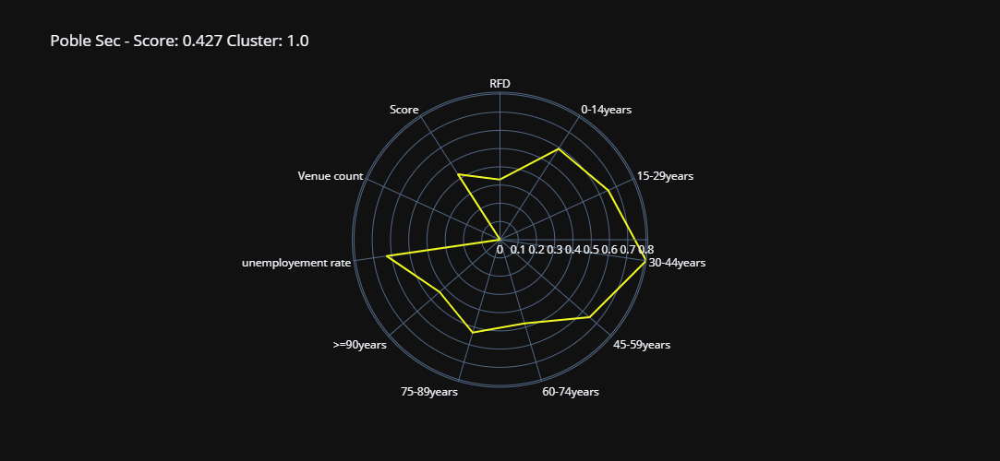

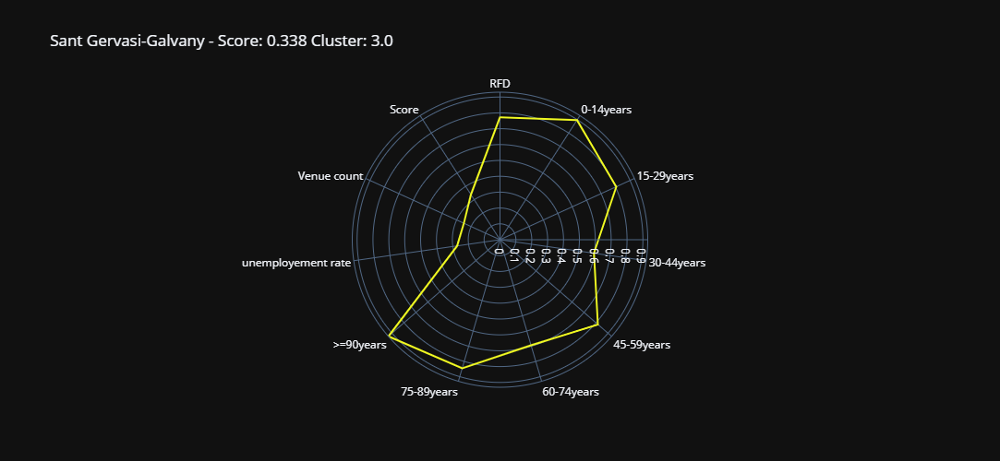

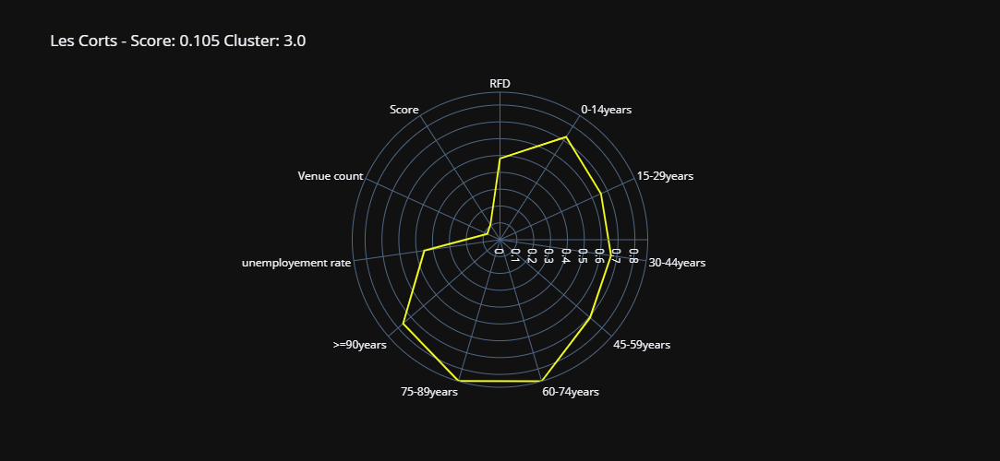

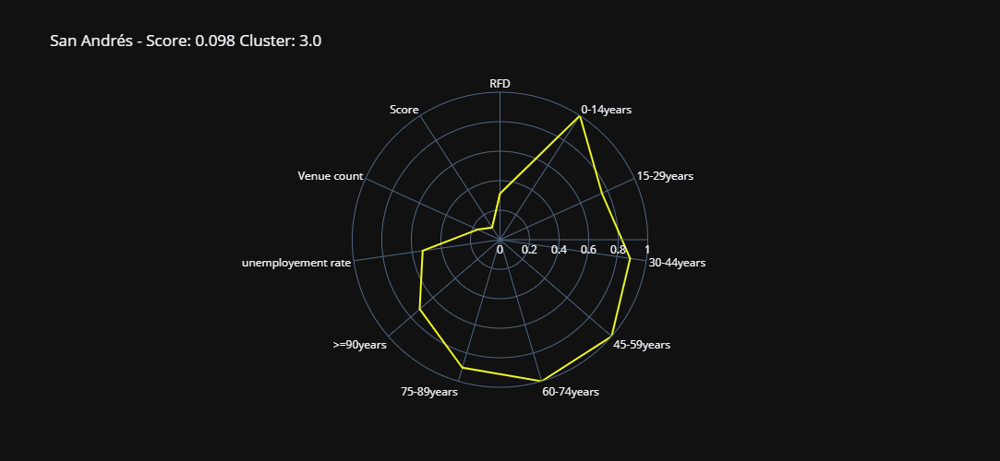

In [85]:
a = polar_neig.columns.to_list() 
for b in a[1:len(a)] :
    
    titulo = str(b) + ' - Score: ' + str(polar_neig.loc[10,b]) + ' Cluster: ' + str(polar_neig.loc[11,b])
    fig = px.line_polar(polar_neig2, r=b, theta="index", line_close=True,
                    color_discrete_sequence=px.colors.sequential.Plasma_r,
                    template="plotly_dark",
                    title = titulo,
                    width = 600, 
                    height = 500)
    fig.show()

# 7.-Discussion <a name = discus></a>

The neighborhoods highlighted in the previous sections look for areas with low competition. But if the business you want to set up is so distinguished and exclusive with a very high product differentiation, we can look at the best neighborhoods for each method. It must be taken into account that the number of businesses per neighborhood is calculated with the distance to the center of the neighborhood, so that some areas may present values ​​that are visually confusing.

Each prominent neighbourhood has some characteristics, so it depends on the type of business that you want to open, one or the other will be appropriate.

### If we want to base ourselves on the cluster technique

In [ ]:
bcn_analysis[bcn_analysis['Cluster Labels']== 3].drop(["Cluster Labels", "latitude", "longitude","NºNeighbourhood","NºBorough"], axis = 1)

### If we want to base ourselves on the Multiple linear regression technique 

In [ ]:
bcn_final_MLR.sort_values("Score", ascending = False).drop([ "latitude", "longitude","NºNeighbourhood","NºBorough"], axis = 1).head(10)

### If we want to base ourselves in our intuition or in a market studies. 

In [ ]:
bcn_final_wf.sort_values("Score", ascending = False).drop([ "latitude", "longitude","NºNeighbourhood","NºBorough"], axis = 1).head(10)

## Highlighted neighbourhoods in different analysis.  
If we are interested in continuing with the basis that we do not want close competition, the neighborhoods highlighted in the different analyzes applied are the perfect candidates.

Custer by neighbourhood indicators By affinity we see that the neighborhood of "Les Corts" has characteristics very similar to "La derecha del ensache" but 10 times less businesses. So it is a good candidate to start a business. The neighbourhood of "San Andres" too are a good candidate also don't have nearly business to compete. The neighbourhood Sant Gervasi-Galvany content in the same cluster have a high RFD indicator, this may be interesting if want a gourmet products.

With the multiple linear regression we see that the Poble sec neighbourhood has 0 businesses but a prediction of 4. It is seen that this neighborhood is close to the downtown area and also has a high score in the analysis by weighted factors.

with the Weighted factors method we see that the neighbourhoods of San Andrés, les corts and Poble Sec are the zones with high interest according the selected factors and less numbers of target venues.


# 8.-Conclusions <a name = conclusiones></a>

Once the neighbourhoods with different techniques have been analyzed. Several aspects can be concluded.

1.-The location data isn't very good, this is due to the free version of Foursquare. It **would be interesting to obtain very precise location data**, and assess the distance to the city center and other factors.

2.- The **city center accumulates most of the businesses**, this is because if there is a good transport system in a few minutes you can reach a business. Or you can accumulate businesses of various types in an area. That is, the location is a determining factor.

3.- Various techniques have been analyzed and the neighborhoods of **Les Corts, San Andrés, Poble Sec, Sant Gervasi-Galvany**, are the most suitable if we **are interested in not having competition nearby**.

4.-If the business we want to set up is focused on **exclusive but not very expensive products** and we are interested in the **downtown** area, then **Poble sec** is the ideal place.

5.-If we are interested in neighborhoods with the same characteristics as the downtown area but far from it, **San Andrés** is the most suitable place. This neighborhood can host a type of **local business for daily purchases with high quality but not exclusivity or high prices**.

6.-If the business we have in mind is a **local market for daily purchases and high-end products**, **Sant Gervasi-Galvany** is the best neighborhood. The **high RFD indicator** and its low number of businesses are a good place to set up a business with the characteristics described.

7.-If the type of business to be opened is totally exclusive and has no direct competitors due to the differentiation of the product, any of the first neighborhoods obtained in the multiple linear regression is a good candidate. In this case, it would be interesting to be in the downtown area and have anyone from Barcelona as a client.


In [86]:
bcn_n_geo = r'barris.geojson' # geojson file

conclusion = bcn_final_MLR.iloc[[18,59,10,25]]
conclusion["Score"] = 1

neighbour_map = folium.Map(location=[41.3828939, 2.1774322], zoom_start=11)
neighbour_map.choropleth(
    geo_data=bcn_n_geo,
    data=conclusion,
    columns=['Neighbourhood', 'Score'],
    key_on='feature.properties.NOM',
    fill_color='YlGn', 
    fill_opacity=0.7, 
    line_opacity=0.5,
    legend_name='Barcelona Best Neighbourhood',
    reset = True
)

color = ["blue", "green","orange","red", "black"]
for a in range(0,5):
    for lat, long, bor,Nºneig, neig,score in zip( bcn_final_cluster[bcn_final_cluster['Cluster Labels']== a]["latitude"],
                                           bcn_final_cluster[bcn_final_cluster['Cluster Labels']== a]["longitude"],
                                           bcn_final_cluster[bcn_final_cluster['Cluster Labels']== a]['Borough'],
                                           bcn_final_cluster[bcn_final_cluster['Cluster Labels']== a]['NºNeighbourhood'], 
                                           bcn_final_cluster[bcn_final_cluster['Cluster Labels']== a]['Neighbourhood'],
                                           bcn_analysis[bcn_analysis['Cluster Labels']== a]['Score']):
        label = 'Cluster: {}, Borough: {}, Neihbourhood: {},{}, Score:{}'.format(a, bor,Nºneig,neig,score)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
        [lat, long],
        radius=3,
        popup=label,
        color=color[a],
        fill=True
        ).add_to(neighbour_map)  
    
for lat, long, venue, venuec in zip(bcn_eco_bussines["Venue Latitude"], bcn_eco_bussines["Venue Longitude"],bcn_eco_bussines["Venue"],bcn_eco_bussines["Venue Category"]):
    label = 'Venue: {}, Venue category: {}'.format(venue, venuec)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, long],
        radius=1,
        popup=label,
        color='Purple',
        fill=True
        ).add_to(neighbour_map)  

    

# display map
neighbour_map

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# 9.-References <a name = ref></a>


[1] 'Getting started with Data Science' Publisher: IBM Press; 1 edition(Dec 13 2015) author: Murtaza Haider.      
[2]  <a href =  "https://es.wikipedia.org/wiki/Distritos_de_Barcelona"> Wikipedia information of neighbourhoods</a>      
[3]  <a href = "https://ajuntament.barcelona.cat/estadistica/catala/index.htm"> Barcelona ajuntament. Officina municiapal de dades</a>     


### Documentation of the modules used in this notebook
<a href="https://www.crummy.com/software/BeautifulSoup/bs4/doc/">BeautifulSoup documentation</a>    
<a href="https://pandas.pydata.org/docs/">pandas documentation</a>   
<a href="https://plotly.com/python/">plotly documentation</a>   
<a href="https://developer.foursquare.com/docs/">Foursquare documentation</a>    
<a href="https://geopy.readthedocs.io/en/stable/">geopy documentation</a>    
<a href="https://python-visualization.github.io/folium/">Folium documentation</a>    